In [2]:
import torch
import torchvision
import numpy as np
import pandas as pd
import os
import cv2
import time
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from IPython.display import clear_output

from torch.utils.data import Dataset, DataLoader
from torch import nn

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.utils import draw_bounding_boxes
import torchvision.transforms as T

from torchvision.ops.boxes import nms

# Создание датасета

Создадим класс датасета в pytorch. Для этого загрузим csv-файлы с аннотациями к спутниковым снимкам. Снимки используются те же, что и при обучении YOLO. Их размер близок к 640x640.

In [2]:
df_train = pd.read_csv('isaid_yolov5/train.csv')
df_val = pd.read_csv('isaid_yolov5/val.csv')

print(f'Число изображений в тренировочной выборке: {df_train["filename"].nunique()}')
print(f'Число изображений в валидационной выборке: {df_val["filename"].nunique()}')

df_val

Число изображений в тренировочной выборке: 7975
Число изображений в валидационной выборке: 2613


,filename,xmin,ymin,xmax,ymax,class
0,P0003_0_0.jpg,464,653,487,674,1
1,P0003_0_0.jpg,200,384,256,427,2
2,P0003_0_0.jpg,223,557,281,597,2
3,P0003_0_0.jpg,567,526,623,549,2
4,P0003_0_0.jpg,531,580,629,603,2
...,...,...,...,...,...,...
118379,P2802_5_6.jpg,565,595,599,616,3
118380,P2802_5_6.jpg,258,0,273,5,3
118381,P2802_5_6.jpg,0,44,139,232,4
118382,P2802_5_6.jpg,185,25,313,174,4


In [3]:
df_train['bbox'] = df_train[['xmin', 'ymin', 'xmax' , 'ymax']].apply(list, axis=1)
df_val['bbox'] = df_val[['xmin', 'ymin', 'xmax' , 'ymax']].apply(list, axis=1)

df_train = df_train.drop(columns=['xmin', 'ymin', 'xmax' , 'ymax']).groupby('filename', as_index=False).agg(list)
df_val = df_val.drop(columns=['xmin', 'ymin', 'xmax' , 'ymax']).groupby('filename', as_index=False).agg(list)

In [4]:
df_train

,filename,class,bbox
0,P0000_0_0.jpg,"[2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ...","[[907, 140, 935, 157], [967, 53, 968, 69], [92..."
1,P0000_0_1.jpg,"[2, 3]","[[0, 53, 1, 69], [30, 61, 42, 78]]"
2,P0000_0_3.jpg,[4],"[[7, 771, 125, 900]]"
3,P0000_1_0.jpg,"[1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ...","[[244, 685, 305, 735], [914, 383, 933, 398], [..."
4,P0000_1_1.jpg,"[2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ...","[[276, 75, 293, 99], [184, 848, 200, 864], [25..."
...,...,...,...
7970,P2805_2_0.jpg,"[1, 1, 1, 1, 1, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, ...","[[776, 623, 821, 669], [195, 535, 212, 549], [..."
7971,P2805_2_1.jpg,"[2, 3, 3, 3, 3, 4, 4, 4, 4]","[[233, 405, 261, 425], [223, 648, 244, 662], [..."
7972,P2805_3_0.jpg,"[2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ...","[[821, 134, 846, 172], [440, 667, 481, 689], [..."
7973,P2805_3_1.jpg,"[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ...","[[276, 503, 293, 516], [396, 492, 415, 507], [..."


In [5]:
idx2target = {1: 'storage_tank',
           2: 'Large_Vehicle',
           3: 'Small_Vehicle',
           4: 'plane',
           5: 'ship',
           6: 'Swimming_pool',
           7: 'Harbor',
           8: 'tennis_court',
           9: 'Ground_Track_Field',
           10: 'Soccer_ball_field',
           11: 'baseball_diamond',
           12: 'Bridge',
           13: 'basketball_court',
           14: 'Roundabout',
           15: 'Helicopter'}

In [6]:
class MyDataset(Dataset):
  
    def __init__(self, dataframe, img_path):
        
        self.df = dataframe
        self.img_path = img_path

    def __len__(self):
        return self.df.shape[0]
  
    def __getitem__(self, index):
        img_name = self.df.loc[index,'filename']
        boxes = torch.Tensor(self.df.loc[index, 'bbox']).to(torch.float)
        labels = torch.Tensor(self.df.loc[index, 'class']).to(torch.int64)
        area = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 0])
        iscrowd = torch.zeros(labels.shape[0], dtype=torch.int64)

        target = {}
        target['boxes'] = boxes
        target['labels'] = labels

        img = cv2.imread(os.path.join(self.img_path, img_name))/255.
        img = torch.from_numpy(img).permute(2, 0, 1).to(torch.torch.float)
        return img, target

# Обучение модели

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [25]:
torch.cuda.empty_cache()

In [8]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [5]:
!pip install torchmetrics[detection]

Необходимые функции:

In [5]:
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.ops import batched_nms


def intersection_over_union(dt_bbox, gt_bbox):
    """
    Function for calculating IoU
    """
    int_x0 = max(dt_bbox[0], gt_bbox[0])
    int_y0 = max(dt_bbox[1], gt_bbox[1])

    int_x1 = min(dt_bbox[2], gt_bbox[2])
    int_y1 = min(dt_bbox[3], gt_bbox[3])

    intersection = max(int_x1 - int_x0, 0) * max(int_y1 - int_y0, 0)
    dt_area = (dt_bbox[2] - dt_bbox[0]) * (dt_bbox[3] - dt_bbox[1])
    gt_area = (gt_bbox[2] - gt_bbox[0]) * (gt_bbox[3] - gt_bbox[1])

    return intersection / (dt_area + gt_area - intersection)


def apply_nms(orig_prediction, iou_thresh=0.3):
    """
    Function for NMS
    """
    
    keep = batched_nms(orig_prediction['boxes'], orig_prediction['scores'], orig_prediction['labels'], iou_thresh)

    final_prediction = orig_prediction

    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction


@torch.inference_mode()
def visualize(model, batch):
    """
    Function for visualisation of model's predictions after each epoch
    """
    model.eval()
    
    to_pil = T.ToPILImage()
    to_tensor = T.PILToTensor()

    xs, ys = batch

    for i, (x, y) in enumerate(zip(xs, ys)):
        prediction = {k: v.to(device) for k, v in model([x.to(device)])[0].items()}

        prediction = apply_nms(prediction)

        x = to_tensor(to_pil(x.cpu()))

        true_boxes = draw_bounding_boxes(x, boxes=y['boxes'], labels=[idx2target[label.item()] for label in y['labels']], width=1, colors='lime')
        predicted_boxes = draw_bounding_boxes(x, boxes=prediction['boxes'], labels=[idx2target[label.item()]+' '+str(round(score.item(),2)) for label, score in zip(prediction['labels'], prediction['scores'])], width=1, colors='lime')
        
        fig, ax = plt.subplots(1, 2, figsize=(20, 10), facecolor='white')

        ax[0].imshow(to_pil(true_boxes))
        ax[1].imshow(to_pil(predicted_boxes))

        ax[0].axis('off')
        ax[1].axis('off')

        ax[0].set_title('Target boxes')
        ax[1].set_title('Predicted boxes')

        plt.subplots_adjust(wspace=0, hspace=0.1)
        plt.show()

        if i >= 9:
            break
            
@torch.inference_mode()
def get_predictions(model, image, iou_thresh=0.3, conf=0.1):
    """
    Function for getting predictions
    
    model: model for predictions
    image: PIL image
    iou_thresh: IoU threshold for NMS
    conf: model's confidence threshold for predictions
    """
    model.eval()
    
    to_pil = T.ToPILImage()
    to_tensor = T.PILToTensor()
     
    x = (to_tensor(image)/255.).to(torch.torch.float)
    
    prediction = {k: v.to(device) for k, v in model([x.to(device)])[0].items()}
    
    prediction = apply_nms(prediction)
    
    boxes = {'boxes':[],'labels':[]}
    
    for box, label, score in zip(prediction['boxes'], prediction['labels'], prediction['scores']):
        if score.item() >= conf:
            boxes['boxes'].append(box)
            boxes['labels'].append(idx2target[label.item()]+' '+str(round(score.item(),2)))
            
    if len(boxes['boxes'])==1:
        boxes['boxes'] = torch.reshape(boxes['boxes'],(1,4))
    else:
        boxes['boxes'] = torch.stack(boxes['boxes'])
    
    x = to_tensor(to_pil(x.cpu()))
    predicted_boxes = draw_bounding_boxes(x, boxes=boxes['boxes'], labels=boxes['labels'], width=1, colors='lime')
    return to_pil(predicted_boxes)

def train(model):
    """
    Training model for 1 epoch
    """
    model.train()
    loss_log = []
    for x, y in tqdm(train_loader, desc='Train'):
        x = list(_.to(device).float() for _ in x)
        y = [{k: v.to(device) for k, v in t.items()} for t in y]

        optimizer.zero_grad()

        output = model(x, y)
        
        loss_sum = sum(loss for loss in output.values())

        loss_sum.backward()

        optimizer.step()
        
        loss_log.append(loss_sum.item())
    return np.mean(loss_log)

def val(model):
    """
    Function for calculating validation loss
    """
    loss_log = []
    for x, y in tqdm(valid_loader, desc='Val'):
        x = list(_.to(device).float() for _ in x)
        y = [{k: v.to(device) for k, v in t.items()} for t in y]

        optimizer.zero_grad()

        with torch.no_grad():
            output = model(x, y)
        
        loss_sum = sum(loss for loss in output.values())
        
        loss_log.append(loss_sum.item())
    return np.mean(loss_log)

@torch.inference_mode()
def evaluate(model, loader):
    """
    Function for model's evaluation
    """
    model.eval()
    
    metric = MeanAveragePrecision()

    for x, y in tqdm(loader, desc='Evaluation'):
        x = list(_.to(device).float() for _ in x)

        output = model(x)
        
        output = [{k: v.cpu() for k, v in t.items()} for t in output]

        metric.update(output, y)

    return metric.compute()

def plot_losses(train_losses, valid_losses, title):
    """
    Function for plotting losses
    """
    plt.figure(figsize=(16, 8))

    plt.title(title + ' loss')
    
    plt.plot(train_losses, label='Train loss')
    plt.plot(valid_losses, label='Valid loss')
    plt.legend()
    plt.grid()

    plt.show()
    
def whole_train_valid_cycle(model, num_epochs, title, scheduler=None):
    """
    Function for training model
    """
    batch = next(iter(valid_loader))
    
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        print(f'Epoch: {epoch}')
        
        train_loss = train(model)
        val_loss = val(model)
        train_losses.append(train_loss)
        val_losses.append(val_loss)

        clear_output()

        visualize(model, batch)
        
        plot_losses(train_losses, val_losses, title)
        
        if scheduler is not None:
            scheduler.step()

Модель:

In [14]:
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor


def get_detection_model():
    model = fasterrcnn_mobilenet_v3_large_fpn(weights='COCO_V1')
    model.roi_heads.box_predictor = FastRCNNPredictor(1024, 16)
    return model

Обучение:

In [15]:
train_dataset = MyDataset(df_train, 'isaid_yolov5/train/images')
val_dataset = MyDataset(df_val, 'isaid_yolov5/val/images')

train_loader = DataLoader(
    train_dataset,
    batch_size=8,
    shuffle=True,
    pin_memory=True,
    collate_fn=collate_fn
)

valid_loader = DataLoader(
    val_dataset,
    batch_size=8,
    shuffle=False,
    pin_memory=True,
    collate_fn=collate_fn
)

In [49]:
next(iter(train_loader))[1]

[{'boxes': tensor([[360., 630., 418., 692.],
          [285., 625., 496., 861.]]),
  'labels': tensor([2, 4])},
 {'boxes': tensor([[ 54., 332., 221., 404.],
          [ 45., 303., 211., 370.],
          [377., 179., 487., 232.],
          [  0., 112., 155., 180.],
          [443., 387., 553., 433.],
          [  5., 174., 170., 244.],
          [ 14., 204., 181., 276.],
          [394., 257., 506., 309.],
          [  0., 146., 163., 211.],
          [405., 285., 514., 334.],
          [430., 311., 540., 359.],
          [ 72., 394., 241., 466.],
          [ 24., 237., 190., 309.],
          [ 33., 271., 200., 341.],
          [ 65., 364., 234., 433.],
          [363., 148., 474., 198.]]),
  'labels': tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])},
 {'boxes': tensor([[737., 583., 829., 635.]]), 'labels': tensor([5])},
 {'boxes': tensor([[363., 231., 433., 326.],
          [301., 257., 371., 351.],
          [186., 306., 257., 400.],
          ...,
          [644., 635., 662.

In [20]:
model = get_detection_model().to(device)

optimizer = torch.optim.Adam([p for p in model.parameters() if p.requires_grad], lr=1e-4)

Downloading: "https://download.pytorch.org/models/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth
100%|██████████| 74.2M/74.2M [00:00<00:00, 90.4MB/s]


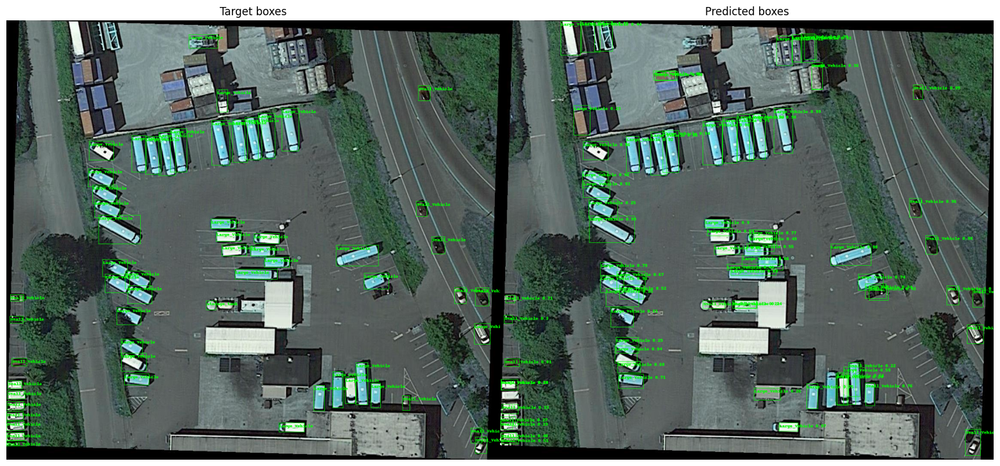

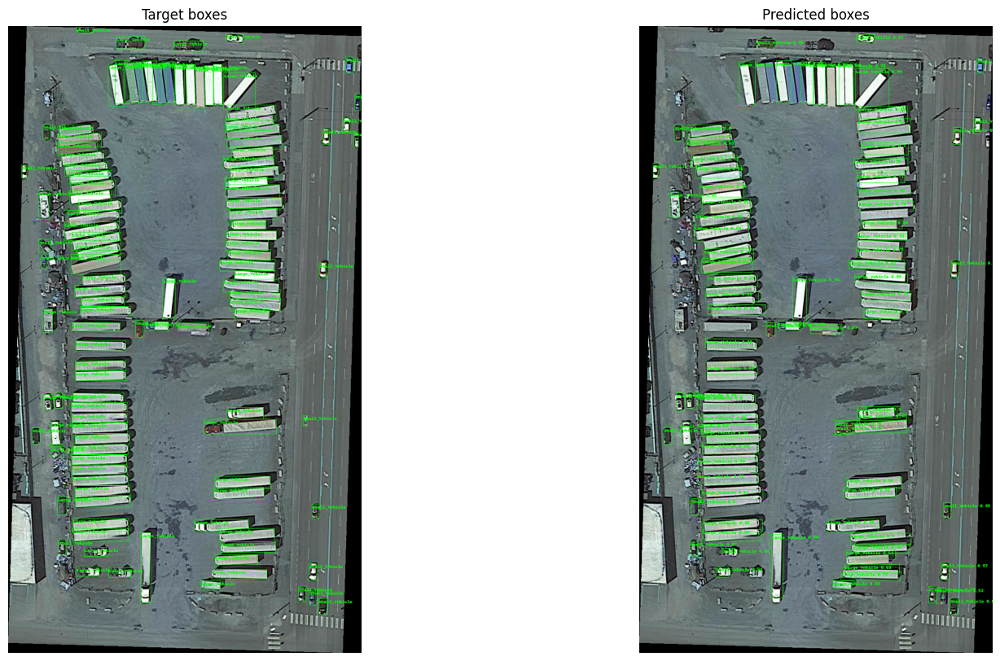

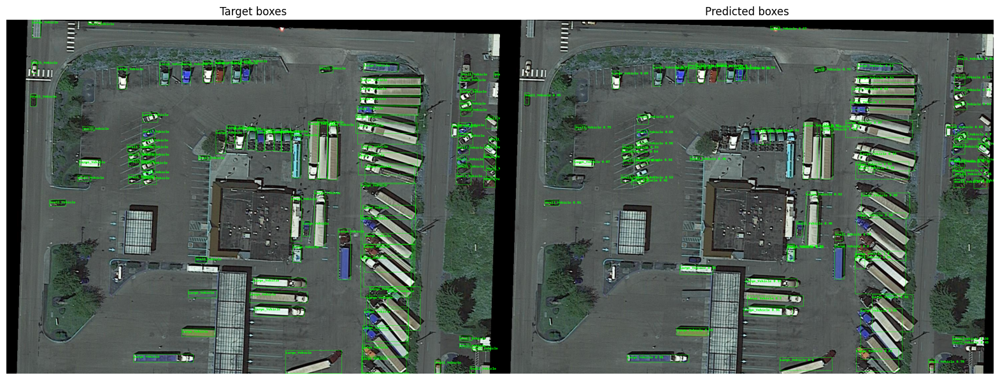

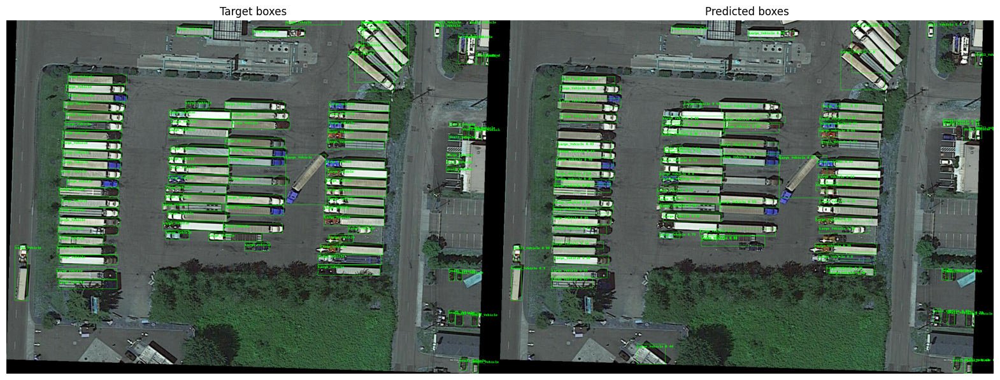

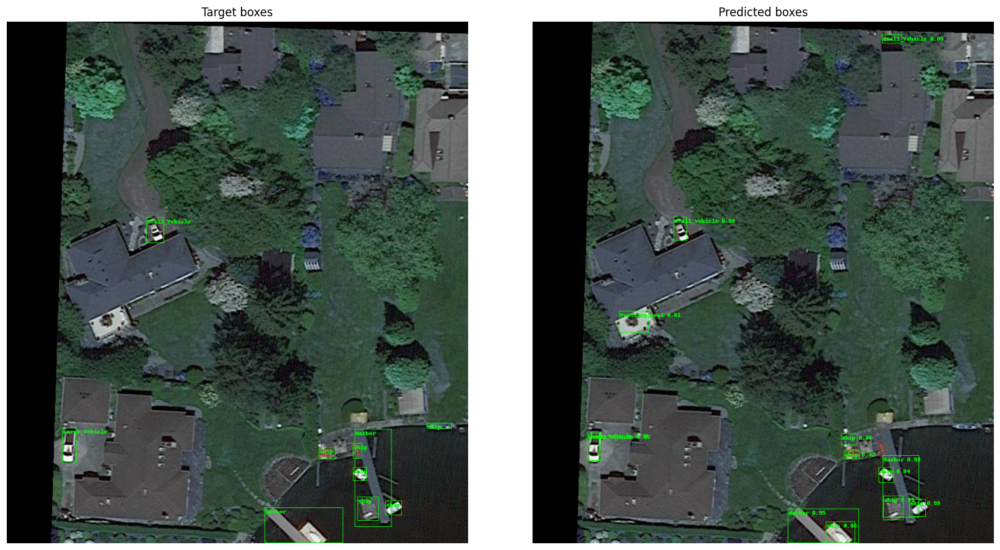

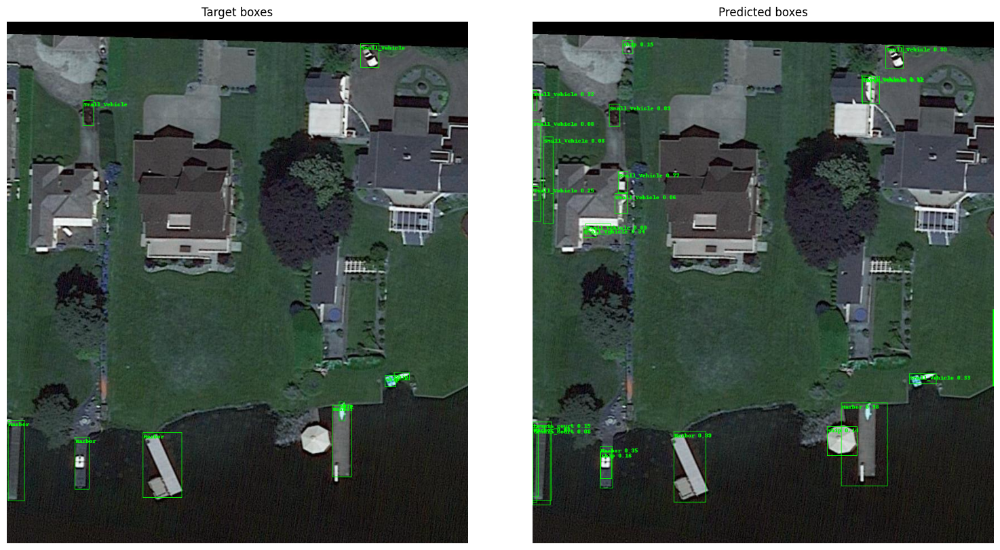

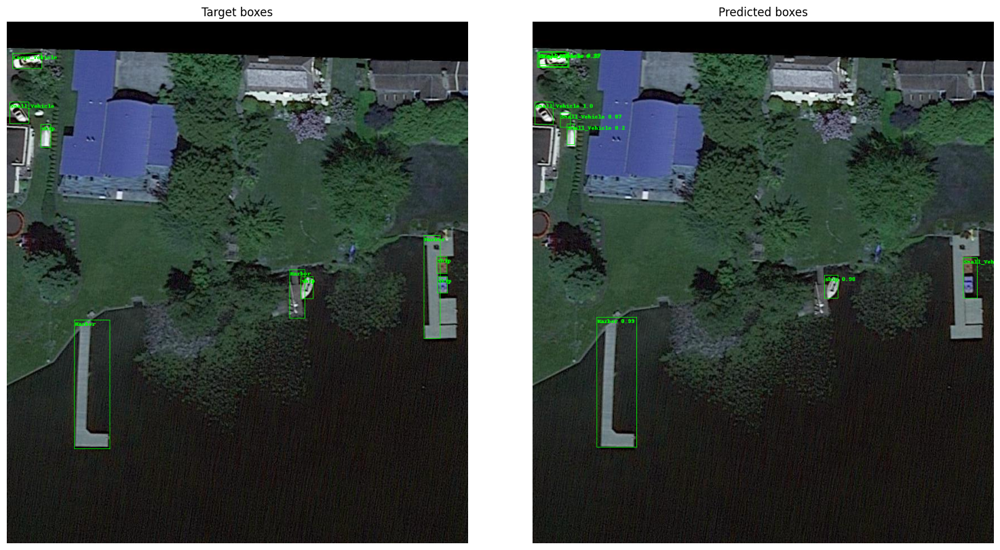

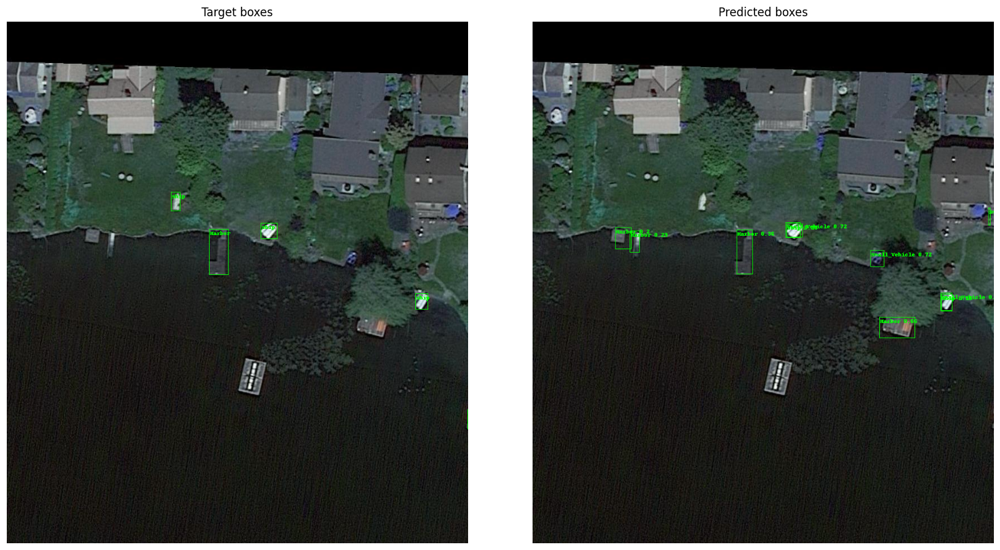

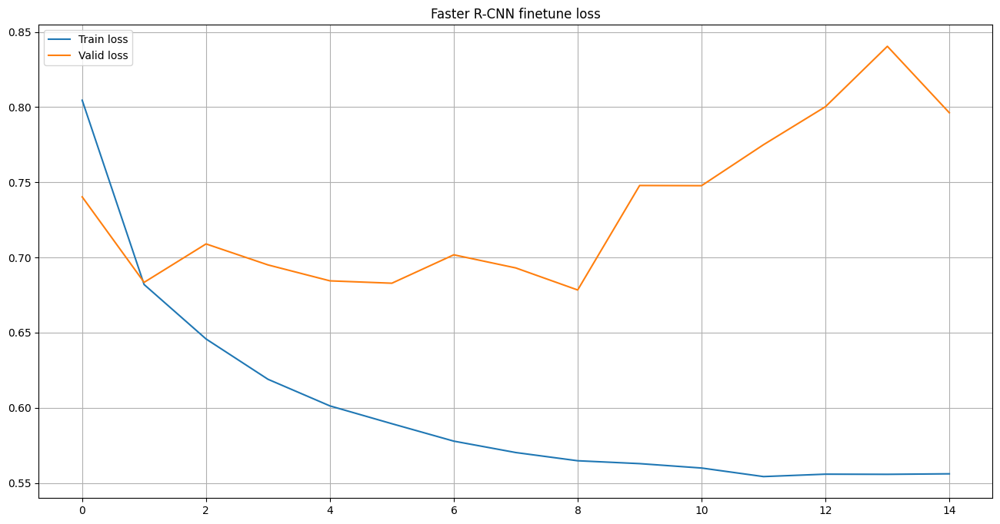

In [21]:
whole_train_valid_cycle(model, 15, 'Faster R-CNN finetune')
torch.save(model.state_dict(), '/kaggle/working/fasterrcnn_mobilenet_v3.pth')

Посмотрим на метрики модели:

In [22]:
train_map = evaluate(model, train_loader)
valid_map = evaluate(model, valid_loader)

print(f'Train mAP {train_map['map']:.5f} Valid mAP {valid_map['map']:.5f}')

Evaluation:   0%|          | 0/997 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Evaluation:   0%|          | 0/327 [00:00<?, ?it/s]

Train mAP 0.40910 Valid mAP 0.21741


In [17]:
model = get_detection_model().to(device)
model.load_state_dict(torch.load('fasterrcnn_mobilenet_v3.pth'))

<All keys matched successfully>

In [18]:
valid_map = evaluate(model, valid_loader)
valid_map

Evaluation:   0%|          | 0/327 [00:00<?, ?it/s]

{'map': tensor(0.2175),
 'map_50': tensor(0.3939),
 'map_75': tensor(0.2101),
 'map_small': tensor(0.0298),
 'map_medium': tensor(0.2655),
 'map_large': tensor(0.4492),
 'mar_1': tensor(0.1036),
 'mar_10': tensor(0.2344),
 'mar_100': tensor(0.2735),
 'mar_small': tensor(0.0662),
 'mar_medium': tensor(0.3388),
 'mar_large': tensor(0.5345),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15],
        dtype=torch.int32)}

Посмотрим на предсказания модели:

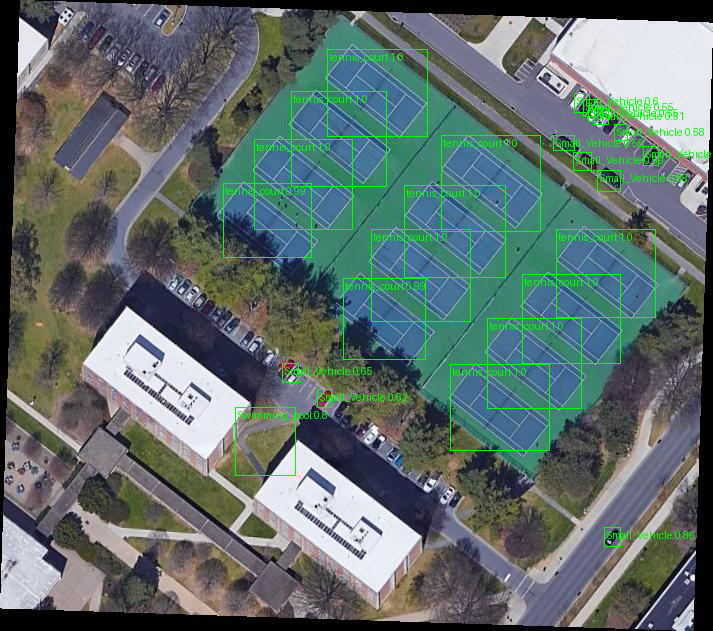

In [99]:
im = Image.open("yolo_training/val/images/P1905_0_0.jpg")
pred_im = get_predictions(model, im, conf=0.3)
pred_im